## Using user data to predict whether User is a Yelp Elite

Can we just use user data (as provided by yelp) to predict whether an User is a Yelp elite?


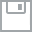
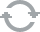
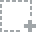
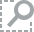
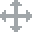
...
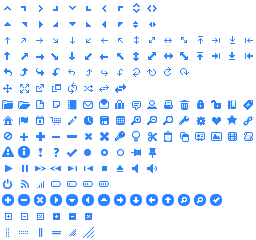
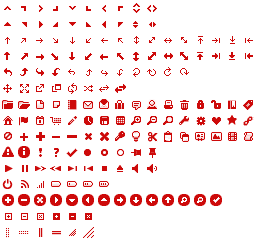
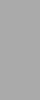
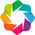
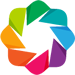

In [1]:
import json
import pandas as pd
import numpy as np
from bokeh.plotting import figure, output_notebook,show
output_notebook()
%matplotlib inline


from unbalanced_dataset import UnderSampler, OverSampler, SMOTE


from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.cross_validation import ShuffleSplit
from sklearn.cross_validation import cross_val_score
from sklearn.cross_validation import train_test_split 

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

from sklearn.svm import SVC

In [2]:
import json

data = []
with open('/Users/chc/desktop/yelp2/yelp_academic_dataset_user.json') as f:
    for line in f:
        data.append(json.loads(line))

In [3]:
yelp_df= pd.DataFrame(data)
yelp_df.head()

,average_stars,compliments,elite,fans,friends,name,review_count,type,user_id,votes,yelping_since
0,4.14,"{u'profile': 8, u'cute': 15, u'funny': 11, u'p...","[2005, 2006]",69,"[rpOyqD_893cqmDAtJLbdog, 4U9kSBLuBDU391x6bxU-Y...",Russel,108,user,18kPq7GPye-YQ3LyKyAZPw,"{u'funny': 166, u'useful': 278, u'cool': 245}",2004-10
1,3.64,"{u'profile': 110, u'cute': 209, u'funny': 561,...","[2005, 2006, 2007, 2008, 2009, 2010, 2011, 201...",1012,"[18kPq7GPye-YQ3LyKyAZPw, 4U9kSBLuBDU391x6bxU-Y...",Jeremy,1233,user,rpOyqD_893cqmDAtJLbdog,"{u'funny': 6849, u'useful': 12642, u'cool': 9837}",2004-10
2,3.59,"{u'profile': 9, u'cute': 23, u'funny': 122, u'...","[2005, 2006, 2007, 2008, 2009, 2010, 2011, 201...",93,"[18kPq7GPye-YQ3LyKyAZPw, rpOyqD_893cqmDAtJLbdo...",Michael,442,user,4U9kSBLuBDU391x6bxU-YA,"{u'funny': 907, u'useful': 1445, u'cool': 727}",2004-10
3,4.64,{u'cute': 2},[],2,"[18kPq7GPye-YQ3LyKyAZPw, rpOyqD_893cqmDAtJLbdo...",Ken,11,user,fHtTaujcyKvXglE33Z5yIw,"{u'funny': 1, u'useful': 11, u'cool': 5}",2004-10
4,3.80,"{u'cute': 2, u'plain': 2, u'writer': 2, u'note...",[2005],3,"[rpOyqD_893cqmDAtJLbdog, HDQixQ-WZEV0LVPJlIGQe...",Katherine,66,user,SIBCL7HBkrP4llolm4SC2A,"{u'funny': 10, u'useful': 34, u'cool': 11}",2004-10


In [4]:
def collector(x):
    return x['cool']

yelp_df['cool']= yelp_df.votes.apply(collector)

In [5]:
def collector1(x):
    return x['useful']

yelp_df['useful']= yelp_df.votes.apply(collector1)

In [6]:
def collector2(x):
    return x['funny']

yelp_df['funny']= yelp_df.votes.apply(collector2)

In [7]:
def elite(x):
    if len(x)>0:
        return 1
    if len(x)<1:
        return 0
    
yelp_df['Elite'] = yelp_df.elite.apply(elite)

In [8]:
yelp_df['Elite2'] = yelp_df.elite.apply(len)

In [9]:
yelp_df['Friends'] = yelp_df.friends.apply(len)

In [10]:
def date(x):
    return 2015 - int(x[0:4])

yelp_df['years']= yelp_df.yelping_since.apply(date)
yelp_df.years.unique()

array([11,  7,  6,  5,  4,  3,  2,  1,  0,  8, 10,  9])

In [11]:
def rounding(x):
    return round(x,1)

yelp_df['round_avg']= yelp_df['average_stars'].apply(rounding)

### Examining Data

In [ ]:
yelpu20 = yelp_df[yelp_df['review_count']<20]

In [121]:
yelp_df[yelp_df['Elite']==1].sort(['review_count'],ascending= True)

/Users/chc/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:1: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  if __name__ == '__main__':


,average_stars,compliments,elite,fans,friends,name,review_count,type,user_id,votes,yelping_since,cool,useful,funny,Elite,Elite2,years,round_avg,Friends
3883,4.00,"{u'profile': 1, u'cute': 12, u'funny': 13, u'p...","[2005, 2006, 2007]",19,"[rpOyqD_893cqmDAtJLbdog, i63u3SdbrLsP4FxiSKP0Z...",Leila,1,user,-1Q1s_NMGjBLBULA8z_npg,"{u'funny': 1, u'useful': 3, u'cool': 2}",2005-06,2,3,1,1,3,10,4.0,33
215598,2.67,"{u'profile': 68, u'funny': 1340, u'cute': 272,...",[2008],172,"[Rir-YRPPClKXDFQbc3BsVw, lxZSVeJz6KEBW1nlA3JKJ...",YuckFelp,3,user,4Hx3TBSKs24K1YhSamFA5g,"{u'funny': 11, u'useful': 12, u'cool': 9}",2006-11,9,12,11,1,1,9,2.7,225
60583,2.40,"{u'profile': 1, u'funny': 25, u'cute': 31, u'p...","[2007, 2008]",19,"[gWcz4QFTW76q8VtpIlZEHQ, qbfQRHLvZk5WSkKY0l_lM...",Casey,5,user,tSXq2TLq1-sdEdM-IiTBRA,"{u'funny': 34, u'useful': 12, u'cool': 7}",2007-02,7,12,34,1,2,8,2.4,57
209713,3.17,"{u'profile': 6, u'funny': 15, u'plain': 16, u'...","[2013, 2014]",7,"[WmAyExqSWoiYZ5XEqpk_Uw, 9hOcfz1_fV5oP1IoHGt7T...",May,6,user,yNxdgWJoCwg3cdO-N03nhQ,"{u'funny': 33, u'useful': 62, u'cool': 40}",2011-10,40,62,33,1,2,4,3.2,139
58406,4.88,"{u'profile': 1, u'funny': 51, u'cute': 4, u'pl...","[2011, 2012, 2013, 2014]",9,"[mAuBHENS_DeFCQqrJC_UxA, 59kUqmk-5HdTCyNuJ0_TM...",Sharon,6,user,pexcENSgtPa9CtgIAJgqqw,"{u'funny': 1, u'useful': 11, u'cool': 3}",2010-03,3,11,1,1,4,5,4.9,44
103879,3.71,"{u'note': 1, u'plain': 2, u'cool': 1, u'more': 1}","[2007, 2008]",3,"[p4Jg_rO_AsCWZGMd_w8xjw, sSW9WcAMaB_oHsjaYtua0Q]",Mordy,7,user,oN2FDM1x7EJXA6Xrqwyubg,"{u'funny': 3, u'useful': 9, u'cool': 4}",2007-07,4,9,3,1,2,8,3.7,2
64793,2.75,"{u'note': 2, u'plain': 9, u'hot': 4, u'funny':...","[2011, 2012, 2013]",3,"[dHCxNa7gLTvTl-to6_PB4w, k-hHJ5cTCkKZfnWP93Zm_...",William,8,user,dQbCcTG1wPeS8f2gNs3eEw,"{u'funny': 112, u'useful': 70, u'cool': 25}",2009-01,25,70,112,1,3,6,2.8,10
121121,3.67,{u'writer': 1},"[2014, 2015]",1,"[bAgO9_hnkDjlFAkUhCSwMQ, dx9TnPQpJzAWCK8pETPHxA]",Miranda,12,user,lz8-GJEkjU4YrNHhlDt8MA,"{u'funny': 0, u'useful': 6, u'cool': 1}",2014-09,1,6,0,1,2,1,3.7,2
103894,4.21,"{u'funny': 2, u'plain': 6, u'writer': 4, u'lis...",[2011],4,"[oyTyA9224xp4LvAR8orr5A, htrelFFsLyjNOjzJzXjcm...",Javad,13,user,AGL6OX0STlq8QyeGSWe8aQ,"{u'funny': 12, u'useful': 56, u'cool': 19}",2009-10,19,56,12,1,1,6,4.2,10
121432,3.79,"{u'note': 1, u'photos': 1, u'writer': 4, u'coo...","[2014, 2015]",2,"[0Q2QhRuyD_oGodCj__wcvQ, bAgO9_hnkDjlFAkUhCSwM...",Caroline,14,user,VX_BPxPhudKWlLFEhGkSVQ,"{u'funny': 7, u'useful': 31, u'cool': 21}",2012-03,21,31,7,1,2,3,3.8,6


In [122]:
yelp_df[yelp_df['average_stars']<2].sort(['review_count'],ascending= False).head(50)

/Users/chc/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:1: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  if __name__ == '__main__':


,average_stars,compliments,elite,fans,friends,name,review_count,type,user_id,votes,yelping_since,cool,useful,funny,Elite,Elite2,years,round_avg,Friends
189364,1.96,{},[],1,"[pnrGw4ciBXJ6U5QB2m0F5g, AO7fRv6Wq-322AZXAWbgX...",Henry,188,user,FjJzeI-Qj3Bo_Vlzo86IYQ,"{u'funny': 112, u'useful': 309, u'cool': 35}",2012-09,35,309,112,0,0,3,2.0,3
207450,1.92,"{u'funny': 1, u'cute': 1, u'plain': 2, u'note'...",[],2,"[J3rNWRLRuZJ_0xsJalIhlA, U2zN6K22bXa9EgfAmGIEb...",CHAUSTER,148,user,Hr2ciCvJworU8xcgFRiGXQ,"{u'funny': 45, u'useful': 93, u'cool': 29}",2008-04,29,93,45,0,0,7,1.9,4
288559,1.57,"{u'plain': 2, u'funny': 1}",[],2,"[gJ3neu7zF9a8wi-fUV0zIw, _yVFOWS2pM6zO3ooQb7uE...",Steven,121,user,-x25qBXg5O1mEi4cB0xUtg,"{u'funny': 17, u'useful': 44, u'cool': 3}",2010-11,3,44,17,0,0,5,1.6,34
7240,1.51,{},[],1,[],Yelp,94,user,6yS9S4EMdEbfW2woi7m0Zg,"{u'funny': 49, u'useful': 212, u'cool': 10}",2008-11,10,212,49,0,0,7,1.5,0
295023,1.76,{},[],1,[],jim,91,user,E3xqchwvY2VMMhN_5oP4Xg,"{u'funny': 35, u'useful': 53, u'cool': 8}",2010-09,8,53,35,0,0,5,1.8,0
140620,1.59,"{u'note': 7, u'plain': 3, u'more': 1, u'funny'...",[],5,"[qJepRDQ4Giedn52XVwRcEA, POiiNAnA2XCHJIzfM6Gsl...",GoFuckYourself,80,user,XUen5Fz_Vh1_DvJzHEQa3g,"{u'funny': 82, u'useful': 107, u'cool': 21}",2010-04,21,107,82,0,0,5,1.6,18
330735,1.98,"{u'note': 2, u'plain': 4, u'hot': 1, u'writer'...",[],1,[],Simon,77,user,cOhwutUO_NYLhzAfeuWiPQ,"{u'funny': 37, u'useful': 110, u'cool': 18}",2009-03,18,110,37,0,0,6,2.0,0
291693,1.96,"{u'plain': 3, u'funny': 2, u'cool': 3}",[],0,"[JJ02KSmRB38oWps-XlCfHA, M91Q6aVX9r1LKX4oLJ9Um...",Tiger,72,user,CpZ_-70GtVsODMpRYXf6iA,"{u'funny': 41, u'useful': 83, u'cool': 7}",2011-04,7,83,41,0,0,4,2.0,5
352477,1.96,"{u'note': 5, u'cool': 2}",[],2,[],Consumer,71,user,wMDM4oML7AU3lMWR99HZpg,"{u'funny': 127, u'useful': 258, u'cool': 34}",2008-11,34,258,127,0,0,7,2.0,0
96728,1.39,"{u'cute': 2, u'funny': 14, u'plain': 15, u'wri...","[2010, 2011]",9,"[STxvuKZQzZZZArmQjCPdTA, yyvwMoMifs1p1cp9B68XI...",Harrison,69,user,IR2WnTt6UOumtJexyjyK3w,"{u'funny': 318, u'useful': 162, u'cool': 86}",2009-09,86,162,318,1,2,6,1.4,28


## PCA testing for >10 reviews

In [12]:
yelpp = yelp_df[yelp_df['review_count']>20]
yelpp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 93884 entries, 0 to 366692
Data columns (total 19 columns):
average_stars    93884 non-null float64
compliments      93884 non-null object
elite            93884 non-null object
fans             93884 non-null int64
friends          93884 non-null object
name             93884 non-null object
review_count     93884 non-null int64
type             93884 non-null object
user_id          93884 non-null object
votes            93884 non-null object
yelping_since    93884 non-null object
cool             93884 non-null int64
useful           93884 non-null int64
funny            93884 non-null int64
Elite            93884 non-null int64
Elite2           93884 non-null int64
Friends          93884 non-null int64
years            93884 non-null int64
round_avg        93884 non-null float64
dtypes: float64(2), int64(9), object(8)
memory usage: 14.3+ MB


In [13]:
yelpp = yelpp.drop(['compliments','elite','friends','name','type','user_id','votes','yelping_since','Elite2','round_avg'],axis=1)

In [14]:
data_10 = yelpp.drop('Elite',axis = 1)
labels_10 = yelpp.Elite


In [15]:
scaler = StandardScaler()
features_norm = scaler.fit_transform(data_10)

data_10_2 = pd.DataFrame(features_norm, columns=data_10.columns)
data_10_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 93884 entries, 0 to 93883
Data columns (total 8 columns):
average_stars    93884 non-null float64
fans             93884 non-null float64
review_count     93884 non-null float64
cool             93884 non-null float64
useful           93884 non-null float64
funny            93884 non-null float64
Friends          93884 non-null float64
years            93884 non-null float64
dtypes: float64(8)
memory usage: 6.4 MB


In [16]:
x = data_10_2.values
y = labels_10.values

In [17]:
pca = PCA(n_components=2)
X_test_r = pca.fit(x).transform(x)

In [18]:
color_mapping = {0:'red',1:'blue'}

colors = []

for value in y:
    new_color = color_mapping[value]
    colors.append(new_color)

In [19]:
##XX=    X_test_r[y_test]

In [20]:
##XX1 = X_test_r[~y_test]

In [21]:
p = figure(title="PCA")

x_values =  X_test_r[:,0]
y_values =  X_test_r[:,1]
p.circle(x = x_values,y=y_values,size = 1,color=colors, alpha =0.5)

show(p)

In [22]:
pca = PCA()
X_r = pca.fit(x).transform(x)

In [23]:
ratios = pca.explained_variance_ratio_
print ratios

[ 0.58247073  0.13098868  0.11897076  0.06664274  0.06624994  0.02911743
  0.00474647  0.00081324]


In [24]:
comp_id = [1, 2, 3, 4]             # id number of component
p = figure(title="Scree Plot",tools='',
           x_axis_label="Principal Component",
          y_axis_label='Eigenvalue')
p.line(comp_id,ratios,color='red')
show(p)

ERROR:/Users/chc/anaconda/lib/python2.7/site-packages/bokeh/validation/check.pyc:E-1000 (COLUMN_LENGTHS): ColumnDataSource column lengths are not all the same: ColumnDataSource, ViewModel:ColumnDataSource, ref _id: 74e8ab21-e22f-4b06-9c66-cffd5c203973


### Modelling on PCA dataset

In [25]:
X_r_train, X_r_test, y_r_train, y_r_test = train_test_split(X_test_r,y, test_size=0.2, random_state=0)

In [81]:
count = 0
for y in y_r_test:
    if y == 1:
        count+=1
count

5105

In [83]:
5105.00000/18777

0.27187516642701176

In [82]:
len(y_r_test)

18777

In [134]:
model = SVC(C=1,kernel='rbf').fit(X_r_train,y_r_train)
y_pred = model.predict(X_r_test)
print classification_report(y_r_test,y_pred)

             precision    recall  f1-score   support

          0       0.88      0.94      0.91     13672
          1       0.81      0.65      0.72      5105

avg / total       0.86      0.86      0.86     18777



###from sklearn import grid_search

parameters = {'kernel':('linear', 'rbf'), 'C':[0.1, 1, 10, 100]}
svr = SVC(kernel='linear')
model = grid_search.GridSearchCV(svr, parameters, n_jobs=4)


model.fit(X_r_train, y_r_train)

In [84]:
gnb = GaussianNB()
gnb.fit(X_r_train,y_r_train)

GaussianNB()

In [85]:
preds = gnb.predict(X_r_test)
preds

array([0, 0, 0, ..., 0, 0, 0])

In [141]:
from sklearn.cross_validation import cross_val_score

np.mean(cross_val_score(KNeighborsClassifier(27), X_test_r, y, cv=5))


0.8670912532377576

In [143]:
scores = []
for i in xrange(11,100,2):
    scores.append(np.mean(cross_val_score(KNeighborsClassifier(i), X_test_r, y, cv=5)))
    
    
max(scores)

0.86964761752230613

In [145]:
count1 = 0
for i in y:
    if i == 1:
        count1+=1
count1

25278

In [146]:
len(y)

93884

In [26]:
1.000000000 - 25278.000000/93884

0.7307528439350688

In [30]:
from sklearn.learning_curve import learning_curve
from sklearn.cross_validation import StratifiedKFold


train_sizes, train_scores, test_scores = learning_curve(KNeighborsClassifier(27),
                                                        X_test_r,
                                                        y,
                                                        train_sizes=np.linspace(0.05, 1.0, 10),
                                                        cv = StratifiedKFold(y, n_folds=5, shuffle=True, random_state=0))

In [32]:
p = figure(title='Learning Curve',y_range=(0.85,0.9))

p.line(x=train_sizes,y=train_scores.mean(axis=1),color='red',legend="Training Scores")

p.line(x=train_sizes,y=test_scores.mean(axis=1),color='blue',legend = "Test Scores")

p.legend.orientation = "top_right"

show(p)

## PCA testing on yelp_df

In [54]:
yelp2 = yelp_df.drop(['compliments','elite','friends','name','type','user_id','votes','yelping_since','Elite2','round_avg'],axis=1)

In [65]:
from sklearn.preprocessing import StandardScaler

In [76]:
scaler = StandardScaler()
features_norm = scaler.fit_transform(data)

data2 = pd.DataFrame(features_norm, columns=data.columns)
data2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 366715 entries, 0 to 366714
Data columns (total 7 columns):
average_stars    366715 non-null float64
fans             366715 non-null float64
review_count     366715 non-null float64
cool             366715 non-null float64
useful           366715 non-null float64
funny            366715 non-null float64
years            366715 non-null float64
dtypes: float64(7)
memory usage: 22.4 MB


In [72]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 366715 entries, 0 to 366714
Data columns (total 7 columns):
average_stars    366715 non-null float64
fans             366715 non-null int64
review_count     366715 non-null int64
cool             366715 non-null int64
useful           366715 non-null int64
funny            366715 non-null int64
years            366715 non-null int64
dtypes: float64(1), int64(6)
memory usage: 22.4 MB


In [105]:
data = yelp2.drop('Elite',axis = 1)
labels = yelp2.Elite


x = data2.values
y = labels.values

X_train, X_test, Y_train, Y_test = train_test_split(x, y, test_size=0.2, random_state=1) 

In [106]:
from sklearn.decomposition import PCA

In [107]:
X = X_test
Y = Y_test

pca = PCA(n_components=2)
X_test_r = pca.fit(X).transform(X)

In [108]:
color_mapping = {0:'blue',1:'red'}

colors = []

for value in Y_test:
    new_color = color_mapping[value]
    colors.append(new_color)

In [122]:
p = figure(title="PCA")

x_values =  X_test_r[:,0]
y_values =  X_test_r[:,1]
p.circle(x = x_values,y=y_values,size = 1,color=colors, alpha =0.05)

show(p)

In [24]:
import matplotlib.pyplot as plt

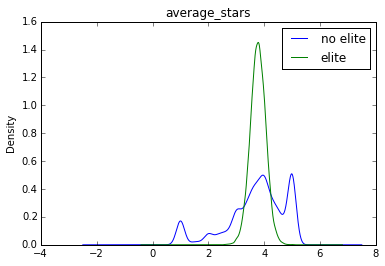

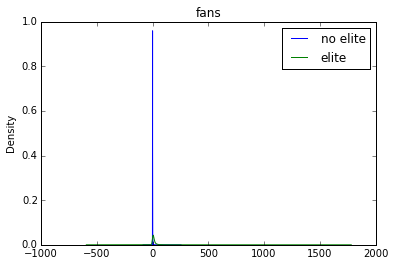

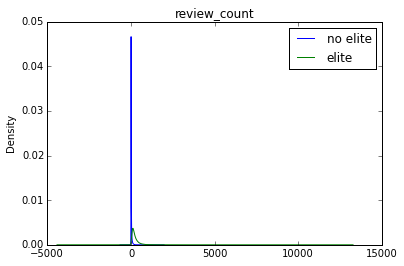

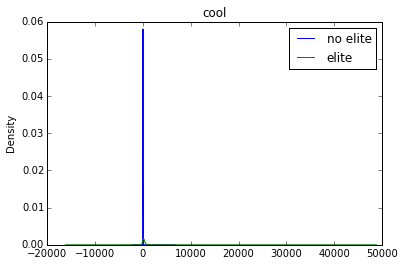

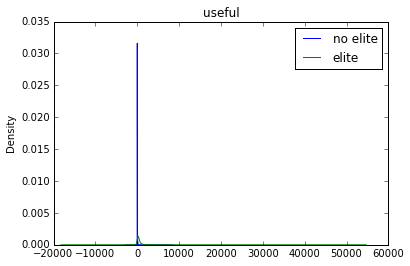

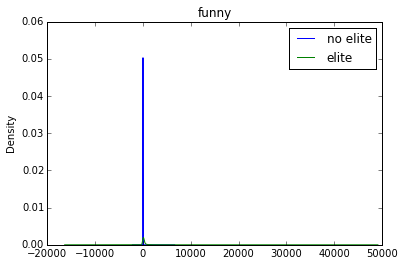

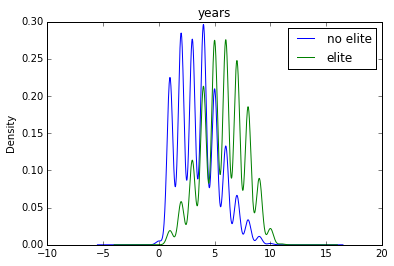

In [57]:
for c in data.columns:
    plt.figure()
    data[labels == 0][c].plot(kind='kde')
    data[labels == 1][c].plot(kind='kde')
    plt.title(c)
    plt.legend(['no elite', 'elite'])
    

In [30]:
data = yelp2.drop('Elite',axis = 1)
labels = yelp2.Elite


x = data.values
y = labels.values

X_train, X_test, Y_train, Y_test = train_test_split(x, y, test_size=0.2, random_state=1)  

NameError: name 'yelp2' is not defined

In [13]:
len(Y_train[Y_train == 0])

273009

In [121]:
US = UnderSampler(verbose=True)
usx, usy = US.fit_transform(x_train,y_train)

Determining classes statistics... 2 classes detected: {0: 212166, 1: 20178}
Under-sampling performed: Counter({0: 20178, 1: 20178})


In [122]:
us_df = pd.DataFrame(usx, columns=data.columns)
us_df['labels'] = usy
us_df.describe().T

,count,mean,std,min,25%,50%,75%,max
average_stars,40356,3.975478,0.496421,3.01,3.64,3.88,4.2,5
fans,40356,8.531049,30.511537,0.00,0.00,2.00,8.0,1298
review_count,40356,132.067846,210.614920,1.00,7.00,60.00,177.0,8843
cool,40356,200.623377,866.807183,0.00,1.00,24.00,122.0,32517
useful,40356,311.846590,1031.952834,0.00,5.00,70.00,273.0,36474
funny,40356,174.164189,788.300382,0.00,1.00,19.00,102.0,32747
Elite2,40356,1.622510,2.053897,0.00,0.00,0.50,3.0,11
years,40356,4.723213,2.187859,0.00,3.00,5.00,6.0,11
round_avg,40356,3.977495,0.497210,3.00,3.60,3.90,4.2,5
labels,40356,0.500000,0.500006,0.00,0.00,0.50,1.0,1


In [42]:
count = 0

for y in y_test:
    if y == 1:
        count +=1
count

4938

In [36]:
len(Y_test)

73343

In [41]:
Y_test.sum()

4938

In [39]:
4939.0000000/73343

0.06734112321557613

In [49]:
np.shape(usx)

(40726, 7)

In [16]:
model_names = ['Logistic Regression', 'KNN', 'Naive Bayes']
models = [LogisticRegression(C=1), KNeighborsClassifier(5), GaussianNB()]
i = 0
for model in models:
    
    model.fit(usx, usy)  
    predictions = model.predict(X_test)

    cm = confusion_matrix(Y_test,predictions)

    #lets make that easier to read
    cm_df = pd.DataFrame(cm, columns=['Predicted Class 0', 'Predicted Class 1'], 
                             index=['Actual Class 0', 'Actual Class 1'])

    print "Results of {}: ".format(model_names[i])
    print cm_df,'\n'
    print "Precision:",float(cm[1,1])/(cm[0,1]+cm[1,1])
    print "Recall:",float(cm[1,1])/(cm[1,0]+cm[1,1]),'\n'
    print "============================================"
    i +=1



Results of Logistic Regression: 
                Predicted Class 0  Predicted Class 1
Actual Class 0              65244               3161
Actual Class 1                398               4540 

Precision: 0.589533826776
Recall: 0.919400567031 

Results of KNN: 
                Predicted Class 0  Predicted Class 1
Actual Class 0              63445               4960
Actual Class 1                188               4750 

Precision: 0.489186405767
Recall: 0.961927906035 

Results of Naive Bayes: 
                Predicted Class 0  Predicted Class 1
Actual Class 0              67410                995
Actual Class 1               1539               3399 

Precision: 0.773554847519
Recall: 0.688335358445 



In [47]:
cm = confusion_matrix(y_test,y_pred)

#lets make that easier to read
cm_df = pd.DataFrame(cm, columns=['Predicted Class 0', 'Predicted Class 1'], 
                         index=['Actual Class 0', 'Actual Class 1'])

print "Results of {}: ".format("SVM")
print cm_df,'\n'
print "Precision:",float(cm[1,1])/(cm[0,1]+cm[1,1])
print "Recall:",float(cm[1,1])/(cm[1,0]+cm[1,1]),'\n'
print "============================================"

Results of SVM: 
                Predicted Class 0  Predicted Class 1
Actual Class 0               3387                686
Actual Class 1                 11               4062 

Precision: 0.85551811289
Recall: 0.997299287994 

